In [1]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

plt.rcParams.update({'figure.dpi': 130, 'font.size': 11})
LOGS = Path('logs/ingp')


## 1 · Load results

In [2]:
records = []
for p in sorted(LOGS.glob('h*/report.json')):
    r   = json.loads(p.read_text())
    cfg = r['config']
    m   = json.loads((p.parent / 'metrics.json').read_text()) if (p.parent / 'metrics.json').exists() else {}
    records.append({
        'run':            p.parent.name,
        'n_levels':       cfg['n_levels'],
        'n_feat':         cfg['n_features_per_level'],
        'log2T':          cfg['log2_hashmap_size'],
        'layers':         cfg['hidden_layers'],
        'neurons':        cfg['hidden_features'],
        'finest_res':     cfg.get('finest_resolution', 512),
        'base_res':       cfg.get('base_resolution', 16),
        'batch_size':     cfg['batch_size'],
        'n_params':       r['n_params'],
        'best_psnr':      r['best_psnr'],
        'best_loss':      r['best_loss'],
        'epochs_trained': r['epochs_trained'],
        'train_sec':      r['train_sec'],
        'ssim':           m.get('ssim'),
        'lpips':          m.get('lpips'),
    })

df = pd.DataFrame(records).sort_values('run').reset_index(drop=True)
df['train_min']  = (df['train_sec'] / 60).round(1)
df['n_params_k'] = (df['n_params'] / 1e3).round(1)
df['enc_dim']    = df['n_levels'] * df['n_feat']

display(df[['run','n_levels','n_feat','log2T','layers','neurons',
            'enc_dim','n_params_k','best_psnr','ssim','lpips','epochs_trained','train_min']]
        .rename(columns={'n_params_k':'params_k','best_psnr':'PSNR (dB)',
                         'epochs_trained':'epochs','train_min':'time (min)',
                         'n_levels':'L','n_feat':'F','log2T':'log₂T'})
        .to_string(index=False))


'           run  L  F  log₂T  layers  neurons  enc_dim  params_k  PSNR (dB) ssim lpips  epochs  time (min)\nh12f2T19_l2n64 12  2     19       2       64       24   12588.7  42.177832 None  None     500        68.7\nh16f1T19_l2n64 16  1     19       2       64       16    8393.9  41.928778 None  None     273        26.9\nh16f2T16_l2n64 16  2     16       2       64       32    2103.5  41.620613 None  None     220        17.2\nh16f2T19_l2n64 16  2     19       2       64       32   16783.6  42.423192 None  None     500       107.0\nh16f4T19_l2n64 16  4     19       2       64       64   33562.8  43.355953 None  None     500       348.9\n h4f2T19_l2n64  4  2     19       2       64        8    4199.1  41.650056 None  None     352        15.4\n h8f2T19_l2n64  8  2     19       2       64       16    8393.9  41.981371 None  None     489        45.3'

## 2 · Load loss curves

In [3]:
def load_loss_curve(run_dir):
    txts = sorted(run_dir.glob('checkpoints/*losses_final.txt'))
    if not txts:
        return None
    losses = np.loadtxt(txts[-1])
    psnr   = -10 * np.log10(losses + 1e-8)
    return np.maximum.accumulate(psnr)

curves = {}
for p in sorted(LOGS.glob('h*/report.json')):
    name = p.parent.name
    c    = load_loss_curve(p.parent)
    if c is not None:
        curves[name] = c
        print(f'{name}: {len(c):,} steps  final PSNR {c[-1]:.2f} dB')


h12f2T19_l2n64: 56,500 steps  final PSNR 42.21 dB
h16f1T19_l2n64: 30,849 steps  final PSNR 41.97 dB
h16f2T16_l2n64: 24,860 steps  final PSNR 41.65 dB
h16f2T19_l2n64: 56,500 steps  final PSNR 42.44 dB
h16f4T19_l2n64: 56,500 steps  final PSNR 43.40 dB
h4f2T19_l2n64: 39,776 steps  final PSNR 41.68 dB
h8f2T19_l2n64: 55,257 steps  final PSNR 42.01 dB


## 3 · Levels ablation  (L ∈ {4, 8, 12, 16})

More levels = more resolution scales; encoding dim = L × F.  
Resolutions: geometric progression from base_resolution=16 to finest_resolution=512.

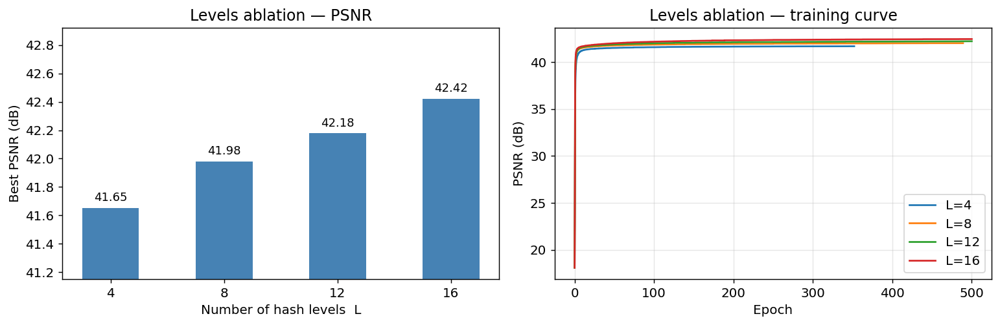

In [4]:
(LOGS / 'ablation').mkdir(exist_ok=True)

levels = df[(df.n_feat == 2) & (df.log2T == 19) & (df.layers == 2) & (df.neurons == 64)].sort_values('n_levels')

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

ax = axes[0]
ax.bar(levels['n_levels'].astype(str), levels['best_psnr'], color='steelblue', width=0.5)
ax.set_xlabel('Number of hash levels  L')
ax.set_ylabel('Best PSNR (dB)')
ax.set_title('Levels ablation — PSNR')
ax.set_ylim(levels['best_psnr'].min() - 0.5, levels['best_psnr'].max() + 0.5)
for bar, v in zip(ax.patches, levels['best_psnr']):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05, f'{v:.2f}', ha='center', fontsize=10)

ax = axes[1]
for _, row in levels.iterrows():
    name = row['run']
    if name in curves:
        c = curves[name]
        steps_per_ep = len(c) // row['epochs_trained']
        epochs = np.arange(len(c)) / max(steps_per_ep, 1)
        ax.plot(epochs, c, label=f"L={int(row['n_levels'])}")
ax.set_xlabel('Epoch'); ax.set_ylabel('PSNR (dB)')
ax.set_title('Levels ablation — training curve')
ax.legend(); ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'levels_ablation.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 4 · Features-per-level ablation  (F ∈ {1, 2, 4})

Controls the width of each hash table entry; encoding dim = L × F.

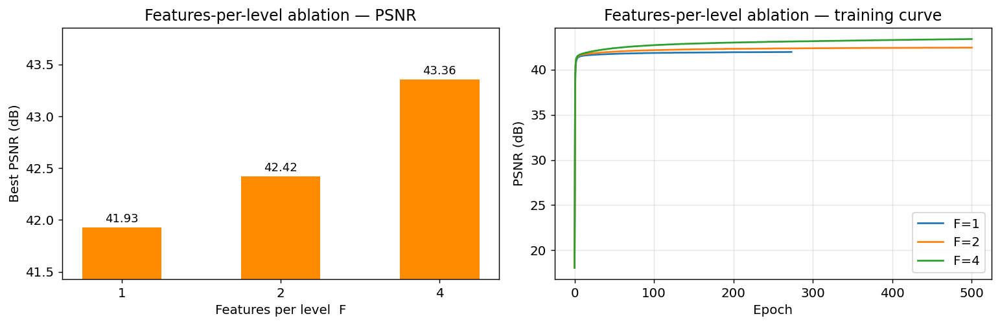

In [5]:
feat = df[(df.n_levels == 16) & (df.log2T == 19) & (df.layers == 2) & (df.neurons == 64)].sort_values('n_feat')

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

ax = axes[0]
ax.bar(feat['n_feat'].astype(str), feat['best_psnr'], color='darkorange', width=0.5)
ax.set_xlabel('Features per level  F')
ax.set_ylabel('Best PSNR (dB)')
ax.set_title('Features-per-level ablation — PSNR')
ax.set_ylim(feat['best_psnr'].min() - 0.5, feat['best_psnr'].max() + 0.5)
for bar, v in zip(ax.patches, feat['best_psnr']):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05, f'{v:.2f}', ha='center', fontsize=10)

ax = axes[1]
for _, row in feat.iterrows():
    name = row['run']
    if name in curves:
        c = curves[name]
        steps_per_ep = len(c) // row['epochs_trained']
        epochs = np.arange(len(c)) / max(steps_per_ep, 1)
        ax.plot(epochs, c, label=f"F={int(row['n_feat'])}")
ax.set_xlabel('Epoch'); ax.set_ylabel('PSNR (dB)')
ax.set_title('Features-per-level ablation — training curve')
ax.legend(); ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'feat_ablation.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 5 · Hash-size ablation  (log₂T ∈ {16, 19, 21})

Smaller T → more hash collisions (multiple voxels share one feature vector).  
Larger T → fewer collisions but more memory.

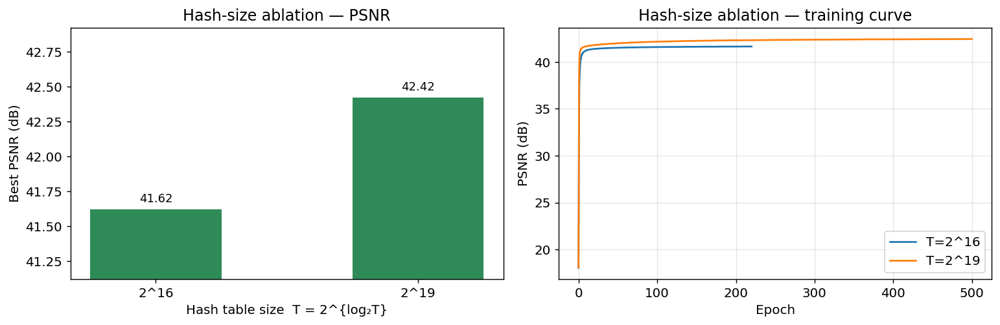

In [6]:
hashsz = df[(df.n_levels == 16) & (df.n_feat == 2) & (df.layers == 2) & (df.neurons == 64)].sort_values('log2T')

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

ax = axes[0]
labels = [f'2^{int(v)}' for v in hashsz['log2T']]
ax.bar(labels, hashsz['best_psnr'], color='seagreen', width=0.5)
ax.set_xlabel('Hash table size  T = 2^{log₂T}')
ax.set_ylabel('Best PSNR (dB)')
ax.set_title('Hash-size ablation — PSNR')
ax.set_ylim(hashsz['best_psnr'].min() - 0.5, hashsz['best_psnr'].max() + 0.5)
for bar, v in zip(ax.patches, hashsz['best_psnr']):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05, f'{v:.2f}', ha='center', fontsize=10)

ax = axes[1]
for _, row in hashsz.iterrows():
    name = row['run']
    if name in curves:
        c = curves[name]
        steps_per_ep = len(c) // row['epochs_trained']
        epochs = np.arange(len(c)) / max(steps_per_ep, 1)
        ax.plot(epochs, c, label=f"T=2^{int(row['log2T'])}")
ax.set_xlabel('Epoch'); ax.set_ylabel('PSNR (dB)')
ax.set_title('Hash-size ablation — training curve')
ax.legend(); ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'hashsz_ablation.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 6 · MLP depth ablation  (hidden_layers ∈ {1, 2, 4})

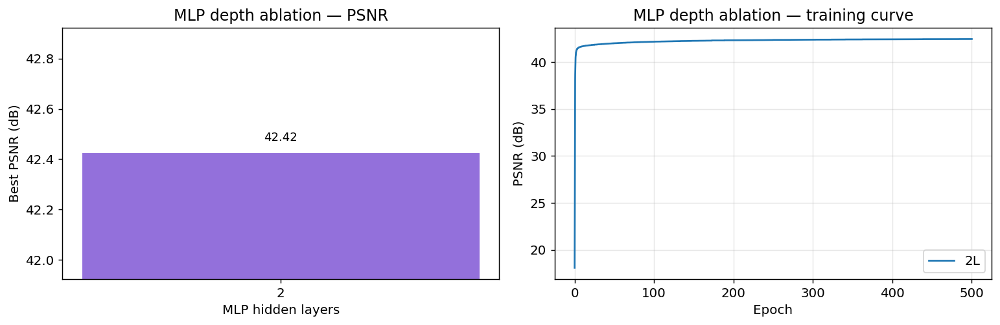

In [7]:
depth = df[(df.n_levels == 16) & (df.n_feat == 2) & (df.log2T == 19) & (df.neurons == 64)].sort_values('layers')

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

ax = axes[0]
ax.bar(depth['layers'].astype(str), depth['best_psnr'], color='mediumpurple', width=0.5)
ax.set_xlabel('MLP hidden layers')
ax.set_ylabel('Best PSNR (dB)')
ax.set_title('MLP depth ablation — PSNR')
ax.set_ylim(depth['best_psnr'].min() - 0.5, depth['best_psnr'].max() + 0.5)
for bar, v in zip(ax.patches, depth['best_psnr']):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05, f'{v:.2f}', ha='center', fontsize=10)

ax = axes[1]
for _, row in depth.iterrows():
    name = row['run']
    if name in curves:
        c = curves[name]
        steps_per_ep = len(c) // row['epochs_trained']
        epochs = np.arange(len(c)) / max(steps_per_ep, 1)
        ax.plot(epochs, c, label=f"{int(row['layers'])}L")
ax.set_xlabel('Epoch'); ax.set_ylabel('PSNR (dB)')
ax.set_title('MLP depth ablation — training curve')
ax.legend(); ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'depth_ablation.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 7 · MLP width ablation  (hidden_features ∈ {32, 64, 128})

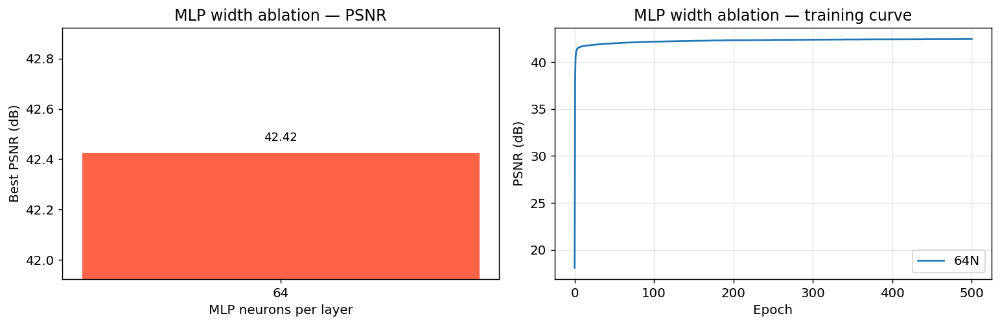

In [8]:
width = df[(df.n_levels == 16) & (df.n_feat == 2) & (df.log2T == 19) & (df.layers == 2)].sort_values('neurons')

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

ax = axes[0]
ax.bar(width['neurons'].astype(str), width['best_psnr'], color='tomato', width=0.5)
ax.set_xlabel('MLP neurons per layer')
ax.set_ylabel('Best PSNR (dB)')
ax.set_title('MLP width ablation — PSNR')
ax.set_ylim(width['best_psnr'].min() - 0.5, width['best_psnr'].max() + 0.5)
for bar, v in zip(ax.patches, width['best_psnr']):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05, f'{v:.2f}', ha='center', fontsize=10)

ax = axes[1]
for _, row in width.iterrows():
    name = row['run']
    if name in curves:
        c = curves[name]
        steps_per_ep = len(c) // row['epochs_trained']
        epochs = np.arange(len(c)) / max(steps_per_ep, 1)
        ax.plot(epochs, c, label=f"{int(row['neurons'])}N")
ax.set_xlabel('Epoch'); ax.set_ylabel('PSNR (dB)')
ax.set_title('MLP width ablation — training curve')
ax.legend(); ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'width_ablation.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 8 · Efficiency — PSNR vs parameters & training time

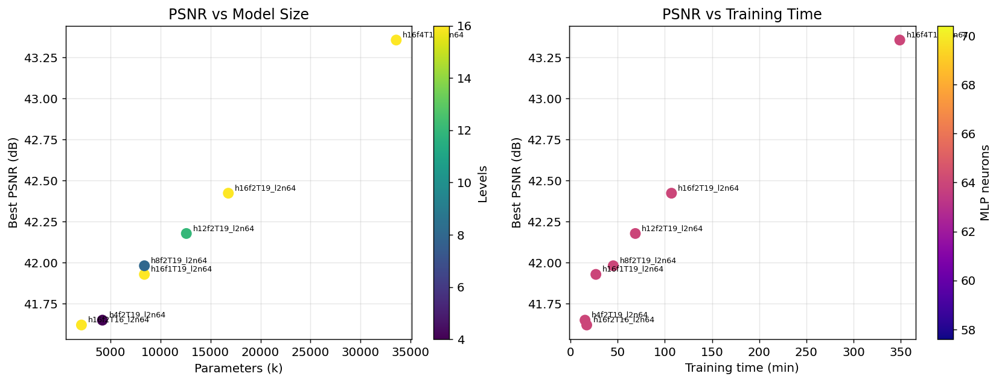

In [9]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

ax = axes[0]
sc = ax.scatter(df['n_params_k'], df['best_psnr'], s=80, c=df['n_levels'], cmap='viridis', zorder=3)
plt.colorbar(sc, ax=ax, label='Levels')
for _, row in df.iterrows():
    ax.annotate(row['run'], (row['n_params_k'], row['best_psnr']),
                textcoords='offset points', xytext=(6, 3), fontsize=7)
ax.set_xlabel('Parameters (k)'); ax.set_ylabel('Best PSNR (dB)')
ax.set_title('PSNR vs Model Size'); ax.grid(alpha=0.3)

ax = axes[1]
sc = ax.scatter(df['train_min'], df['best_psnr'], s=80, c=df['neurons'], cmap='plasma', zorder=3)
plt.colorbar(sc, ax=ax, label='MLP neurons')
for _, row in df.iterrows():
    ax.annotate(row['run'], (row['train_min'], row['best_psnr']),
                textcoords='offset points', xytext=(6, 3), fontsize=7)
ax.set_xlabel('Training time (min)'); ax.set_ylabel('Best PSNR (dB)')
ax.set_title('PSNR vs Training Time'); ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'efficiency.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 9 · All training curves

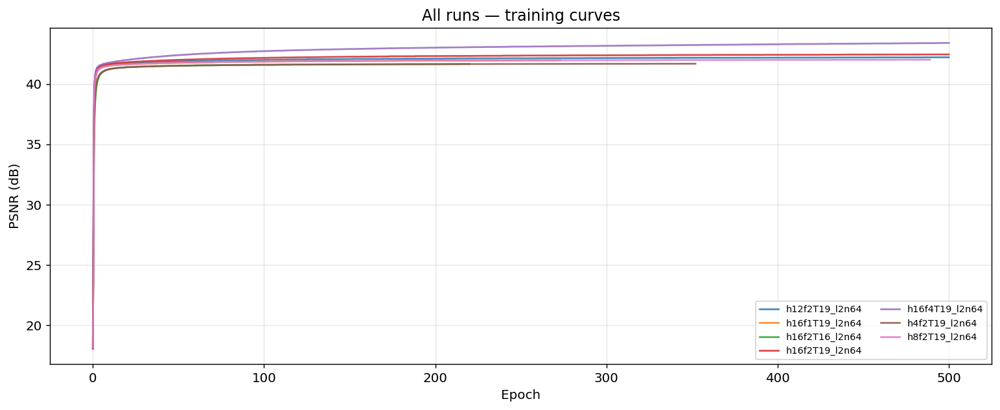

In [10]:
fig, ax = plt.subplots(figsize=(12, 5))
for name, c in sorted(curves.items()):
    row = df[df.run == name]
    if row.empty: continue
    ep = row['epochs_trained'].values[0]
    steps_per_ep = len(c) // ep
    epochs = np.arange(len(c)) / max(steps_per_ep, 1)
    ax.plot(epochs, c, label=name, alpha=0.85)
ax.set_xlabel('Epoch'); ax.set_ylabel('PSNR (dB)')
ax.set_title('All runs — training curves')
ax.legend(fontsize=8, ncol=2); ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'all_curves.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 9b · Summary table + export CSV

In [11]:
has_metrics = df['ssim'].notna().any()
cols    = ['run','n_levels','n_feat','log2T','layers','neurons','n_params','best_psnr','best_loss','epochs_trained','batch_size']
renames = {'best_psnr':'PSNR (dB)', 'best_loss':'MSE', 'epochs_trained':'epochs',
           'n_levels':'L', 'n_feat':'F', 'log2T':'log₂T'}
if has_metrics:
    cols = cols[:8] + ['ssim','lpips'] + cols[8:]
    renames.update({'ssim':'SSIM ↑', 'lpips':'LPIPS ↓'})

summary = df[cols].copy()
summary['best_psnr'] = summary['best_psnr'].round(2)
summary['best_loss'] = summary['best_loss'].map('{:.2e}'.format)
if has_metrics:
    summary['ssim']  = summary['ssim'].map(lambda v: f'{v:.4f}' if v is not None else 'N/A')
    summary['lpips'] = summary['lpips'].map(lambda v: f'{v:.4f}' if v is not None else 'N/A')
summary = summary.rename(columns=renames)
summary.to_csv(LOGS / 'ablation' / 'results.csv', index=False)
print('Saved → logs/ingp/ablation/results.csv')
display(summary)


Saved → logs/ingp/ablation/results.csv


,run,L,F,log₂T,layers,neurons,n_params,PSNR (dB),MSE,epochs,batch_size
0,h12f2T19_l2n64,12,2,19,2,64,12588737,42.18,6.06e-05,500,1048576
1,h16f1T19_l2n64,16,1,19,2,64,8393921,41.93,6.41e-05,273,1048576
2,h16f2T16_l2n64,16,2,16,2,64,2103489,41.62,6.88e-05,220,1048576
3,h16f2T19_l2n64,16,2,19,2,64,16783553,42.42,5.72e-05,500,1048576
4,h16f4T19_l2n64,16,4,19,2,64,33562817,43.36,4.62e-05,500,1048576
5,h4f2T19_l2n64,4,2,19,2,64,4199105,41.65,6.84e-05,352,1048576
6,h8f2T19_l2n64,8,2,19,2,64,8393921,41.98,6.34e-05,489,1048576


## 10 · Setup — model loader, volume, helpers

In [12]:
import sys, torch, torch.nn.functional as F
sys.path.insert(0, str(Path('.')))
from src.ingp import InstantNGPModel
from skimage.metrics import structural_similarity
import lpips as lpips_lib
import tifffile

INPUT       = '10-2900-control-cell-05.oif-C0.v3dpbd.tif'
INFER_BATCH = 2**20
SLICE_IDXS  = [20, 40, 60, 80]
LPIPS_SZ    = 256

vol_raw = tifffile.imread(INPUT).astype('float32')
vmin_v, vmax_v = vol_raw.min(), vol_raw.max()
gt_vol  = (vol_raw - vmin_v) / (vmax_v - vmin_v)
D, H, W = gt_vol.shape
slice_idxs = [max(0, min(D-1, z)) for z in SLICE_IDXS]

axes_g   = [np.linspace(-1, 1, s, dtype='float32') for s in (D, H, W)]
coords_t = torch.from_numpy(
    np.stack([g.flatten() for g in np.meshgrid(*axes_g, indexing='ij')], axis=-1))

lpips_fn = lpips_lib.LPIPS(net='alex').cuda()
lpips_fn.eval()

def reconstruct(model):
    model.cuda().eval()
    parts = []
    with torch.no_grad():
        for i in range(0, len(coords_t), INFER_BATCH):
            parts.append(model(coords_t[i:i+INFER_BATCH].cuda()).squeeze(-1).cpu())
    return torch.cat(parts).numpy().reshape(D, H, W)

def find_best_ckpt(run_dir):
    bests = sorted(run_dir.glob('checkpoints/*_best.pth'))
    return bests[-1] if bests else None

def load_ingp_model(row):
    run_dir = LOGS / row['run']
    ckpt    = find_best_ckpt(run_dir)
    if ckpt is None:
        return None
    model = InstantNGPModel(
        in_features=3,
        hidden_features=int(row['neurons']),
        hidden_layers=int(row['layers']),
        out_features=1,
        n_levels=int(row['n_levels']),
        n_features_per_level=int(row['n_feat']),
        log2_hashmap_size=int(row['log2T']),
        base_resolution=int(row['base_res']),
        finest_resolution=int(row['finest_res']),
    )
    sd = torch.load(ckpt, weights_only=True)
    sd = {k.replace('_orig_mod.', ''): v for k, v in sd.items()}
    model.load_state_dict(sd)
    return model

def slice_metrics(gt_sl, rc_sl):
    ssim_val = structural_similarity(gt_sl, rc_sl, data_range=1.0)
    gt_t = torch.from_numpy(gt_sl)[None, None].expand(1, 3, -1, -1)
    rc_t = torch.from_numpy(rc_sl)[None, None].expand(1, 3, -1, -1)
    gt_t = F.interpolate(gt_t, LPIPS_SZ, mode='bilinear', align_corners=False)
    rc_t = F.interpolate(rc_t, LPIPS_SZ, mode='bilinear', align_corners=False)
    with torch.no_grad():
        lp_val = lpips_fn(gt_t.cuda()*2-1, rc_t.cuda()*2-1).item()
    return ssim_val, lp_val

print(f'Volume {D}×{H}×{W}   slices at z={slice_idxs}')


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/home/armin/miniconda3/envs/mink/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/armin/miniconda3/envs/mink/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /home/armin/miniconda3/envs/mink/lib/python3.8/site-packages/lpips/weights/v0.1/alex.pth
Volume 113×1024×1024   slices at z=[20, 40, 60, 80]


/home/armin/miniconda3/envs/mink/lib/python3.8/site-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, ma

## 11 · SSIM & LPIPS

In [13]:
N_LPIPS_SLICES = 20

metrics_rows = []
for _, row in df.iterrows():
    run_dir      = LOGS / row['run']
    metrics_path = run_dir / 'metrics.json'

    if metrics_path.exists():
        m = json.loads(metrics_path.read_text())
        print(f"{row['run']}: cached   SSIM={m['ssim']:.4f}  LPIPS={m['lpips']:.4f}")
        metrics_rows.append({'run': row['run'], **m})
        continue

    model = load_ingp_model(row)
    if model is None:
        print(f"{row['run']}: no checkpoint — skipping")
        continue

    recon = reconstruct(model)
    torch.cuda.empty_cache()

    ssim_val = float(np.mean([
        structural_similarity(gt_vol[z], recon[z], data_range=1.0)
        for z in range(D)
    ]))

    z_idxs  = np.linspace(0, D - 1, N_LPIPS_SLICES, dtype=int)
    lp_vals = []
    for z in z_idxs:
        gt_t = torch.from_numpy(gt_vol[z])[None, None].expand(1, 3, -1, -1)
        rc_t = torch.from_numpy(recon[z])[None, None].expand(1, 3, -1, -1)
        gt_t = F.interpolate(gt_t, LPIPS_SZ, mode='bilinear', align_corners=False)
        rc_t = F.interpolate(rc_t, LPIPS_SZ, mode='bilinear', align_corners=False)
        with torch.no_grad():
            lp_vals.append(lpips_fn(gt_t.cuda() * 2 - 1, rc_t.cuda() * 2 - 1).item())
    lpips_val = float(np.mean(lp_vals))

    m = {'ssim': ssim_val, 'lpips': lpips_val}
    metrics_path.write_text(json.dumps(m, indent=2))
    print(f"{row['run']}: computed  SSIM={ssim_val:.4f}  LPIPS={lpips_val:.4f}  → saved")
    metrics_rows.append({'run': row['run'], **m})
    del recon

mdf = pd.DataFrame(metrics_rows)
for col in ('ssim', 'lpips'):
    df[col] = df['run'].map(mdf.set_index('run')[col])


h12f2T19_l2n64: computed  SSIM=0.9411  LPIPS=0.0159  → saved
h16f1T19_l2n64: computed  SSIM=0.9381  LPIPS=0.0213  → saved
h16f2T16_l2n64: computed  SSIM=0.9340  LPIPS=0.0329  → saved
h16f2T19_l2n64: computed  SSIM=0.9443  LPIPS=0.0124  → saved
h16f4T19_l2n64: computed  SSIM=0.9557  LPIPS=0.0056  → saved
h4f2T19_l2n64: computed  SSIM=0.9349  LPIPS=0.0293  → saved
h8f2T19_l2n64: computed  SSIM=0.9384  LPIPS=0.0217  → saved


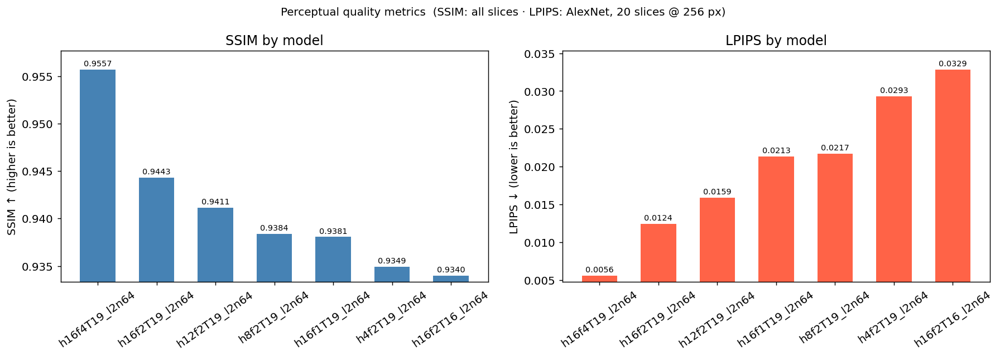

Saved → logs/ingp/ablation/ssim_lpips.pdf


In [14]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, col, label, color, ascending in [
    (axes[0], 'ssim',  'SSIM ↑ (higher is better)',  'steelblue', False),
    (axes[1], 'lpips', 'LPIPS ↓ (lower is better)', 'tomato',    True),
]:
    vals = df[col].dropna()
    if vals.empty:
        ax.set_title(f'{col.upper()} — no data'); continue
    ordered = df.sort_values(col, ascending=ascending).reset_index(drop=True)
    bars = ax.bar(ordered['run'], ordered[col], color=color, width=0.6)
    ax.set_ylabel(label)
    ax.set_title(f'{col.upper()} by model')
    ax.tick_params(axis='x', rotation=35)
    pad = (ordered[col].max() - ordered[col].min()) * 0.03 + 1e-6
    ax.set_ylim(ordered[col].min() - pad, ordered[col].max() + pad * 3)
    for bar, v in zip(bars, ordered[col]):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + pad * 0.3,
                f'{v:.4f}', ha='center', va='bottom', fontsize=8)

plt.suptitle('Perceptual quality metrics  (SSIM: all slices · LPIPS: AlexNet, 20 slices @ 256 px)',
             fontsize=11)
plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'ssim_lpips.pdf', dpi=600, bbox_inches='tight')
plt.show()
print('Saved → logs/ingp/ablation/ssim_lpips.pdf')


## 12 · Volume reconstruction — GT / Recon / Diff  (slices 20 · 40 · 60 · 80)

Processing h12f2T19_l2n64...


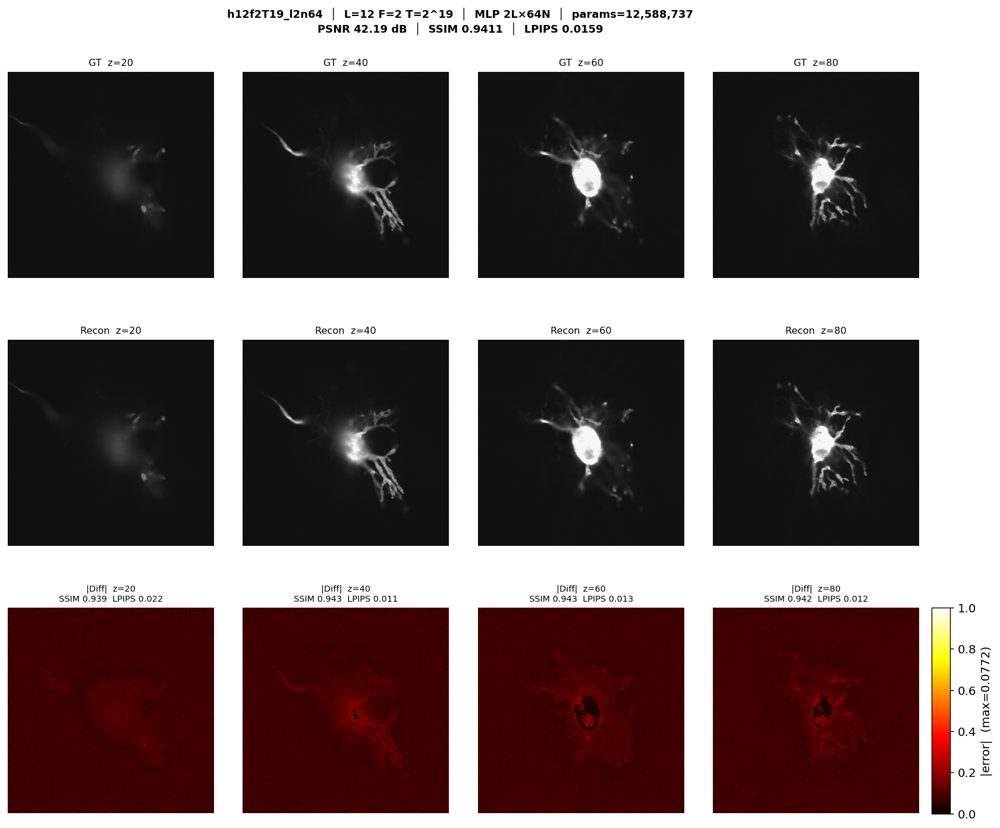

  Saved → logs/ingp/ablation/recon_h12f2T19_l2n64.pdf
Processing h16f1T19_l2n64...


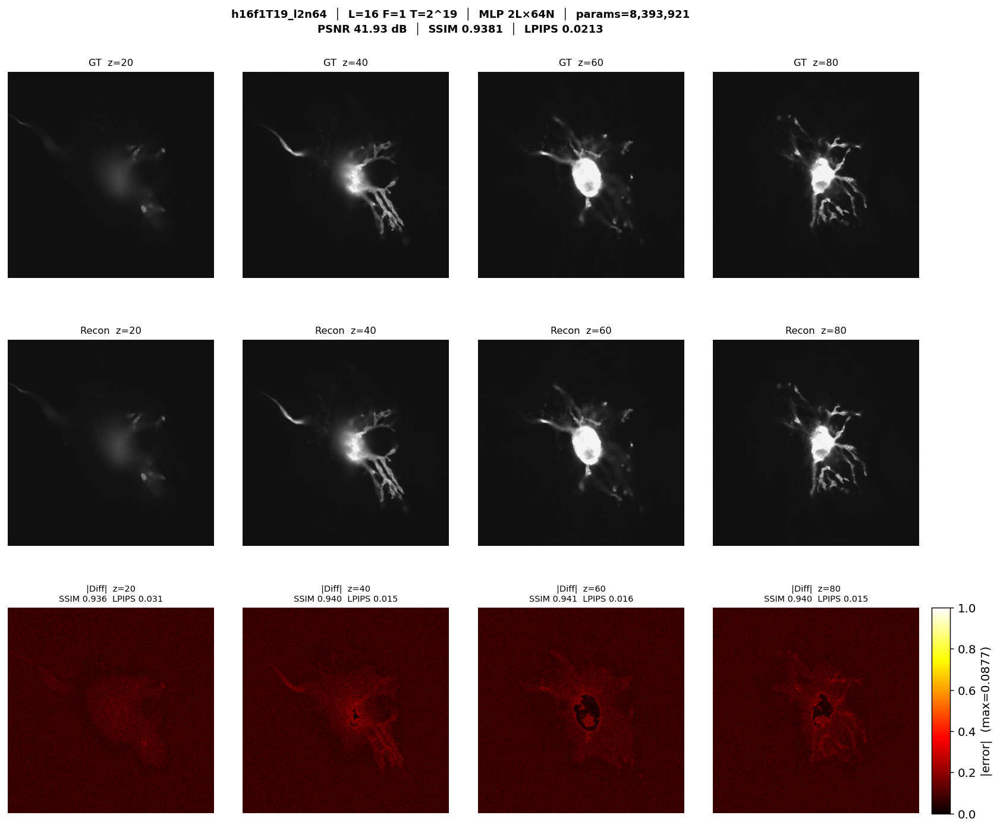

  Saved → logs/ingp/ablation/recon_h16f1T19_l2n64.pdf
Processing h16f2T16_l2n64...


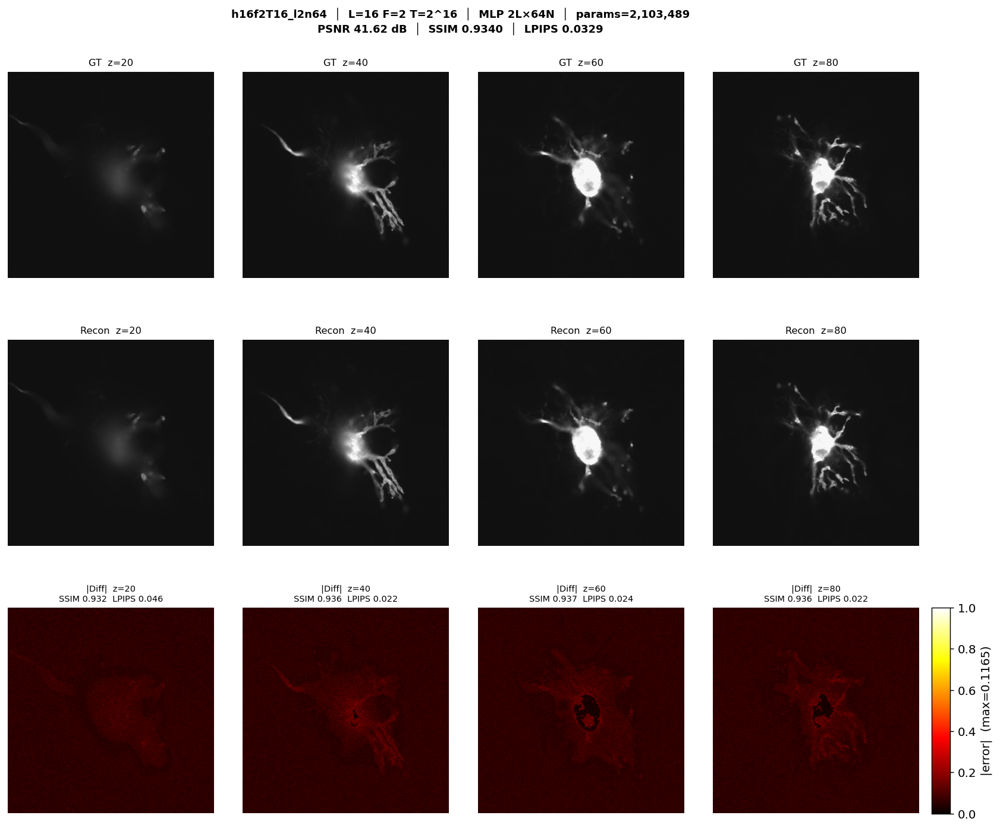

  Saved → logs/ingp/ablation/recon_h16f2T16_l2n64.pdf
Processing h16f2T19_l2n64...


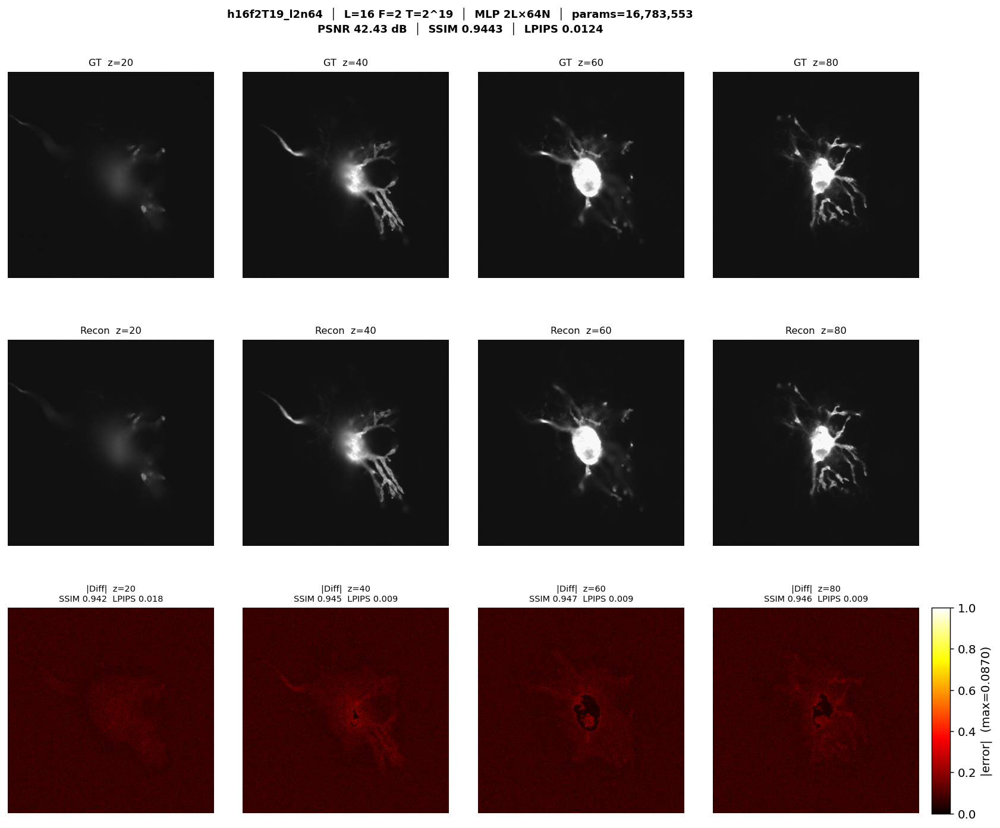

  Saved → logs/ingp/ablation/recon_h16f2T19_l2n64.pdf
Processing h16f4T19_l2n64...


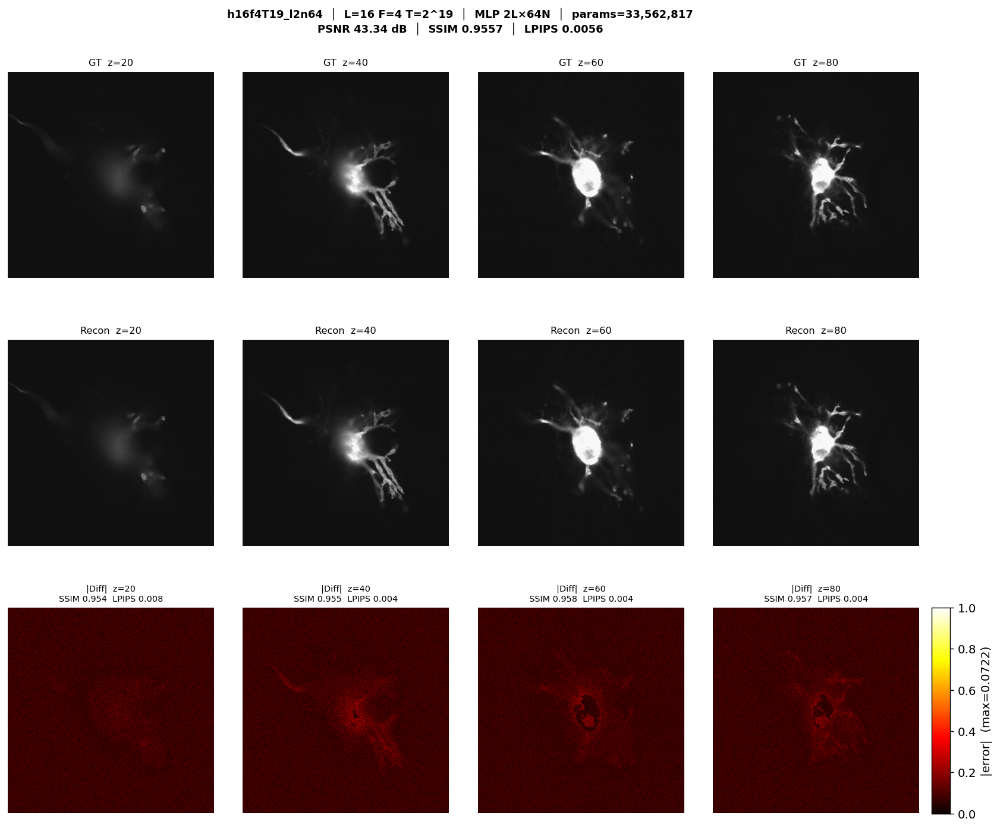

  Saved → logs/ingp/ablation/recon_h16f4T19_l2n64.pdf
Processing h4f2T19_l2n64...


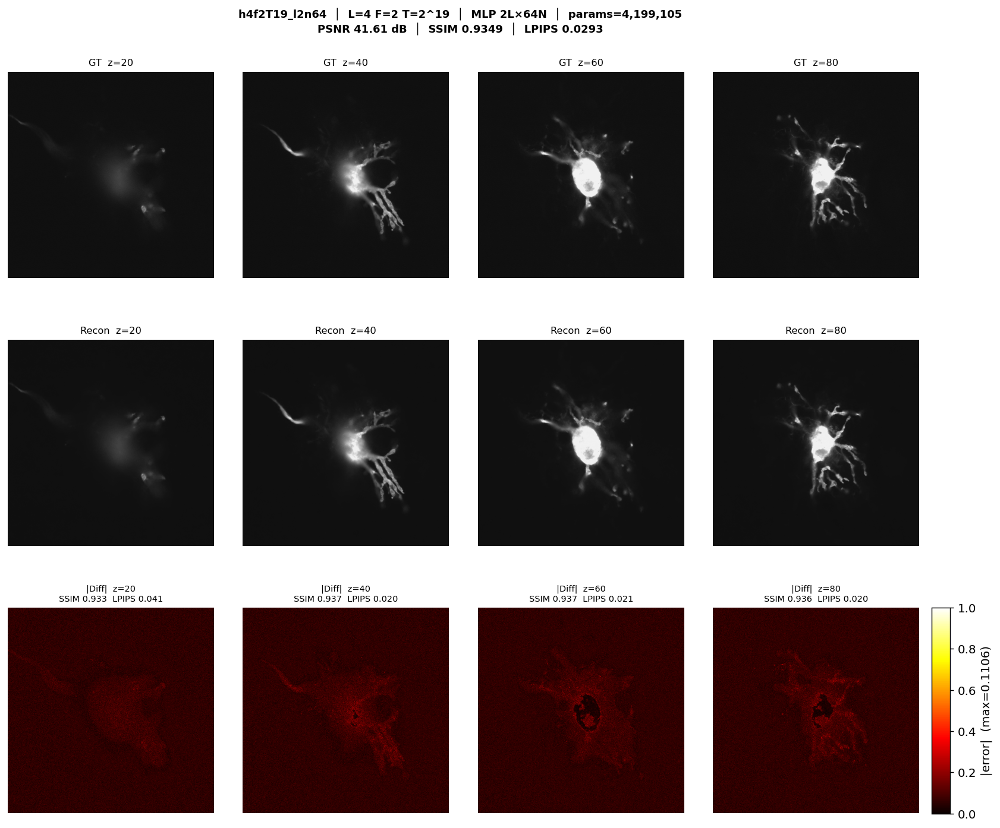

  Saved → logs/ingp/ablation/recon_h4f2T19_l2n64.pdf
Processing h8f2T19_l2n64...


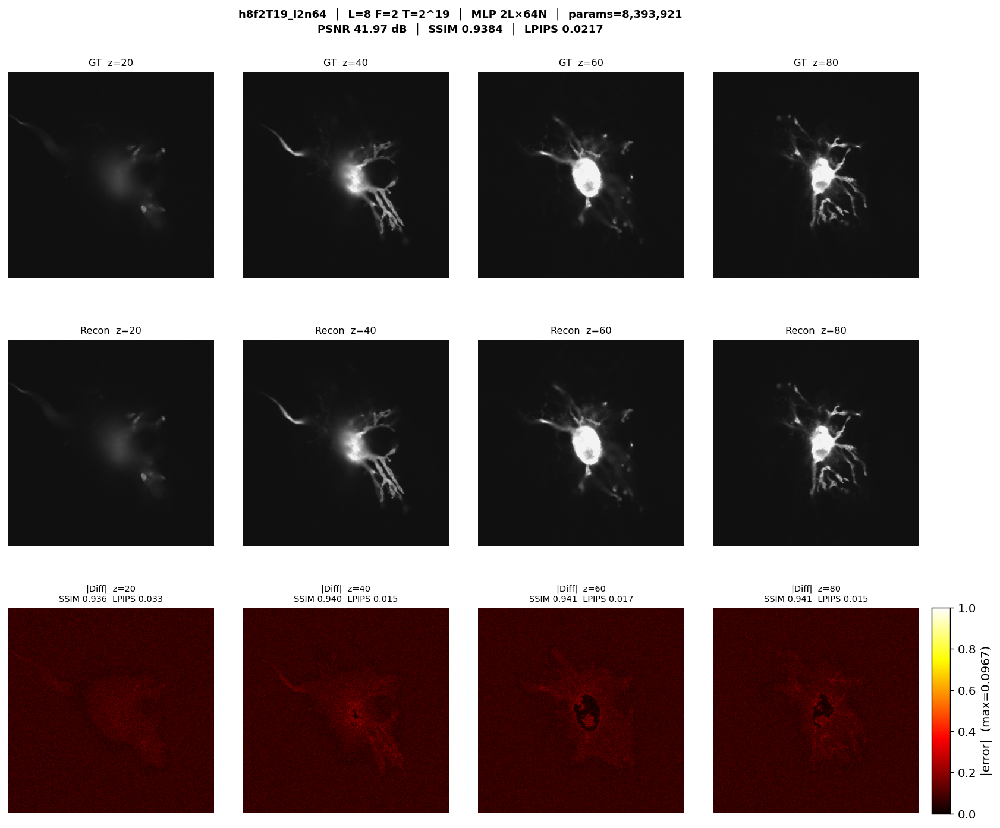

  Saved → logs/ingp/ablation/recon_h8f2T19_l2n64.pdf


In [15]:
for _, row in df.iterrows():
    print(f"Processing {row['run']}...")
    model = load_ingp_model(row)
    if model is None:
        print(f"  no checkpoint, skipping")
        continue

    recon = reconstruct(model)
    diff  = np.abs(recon - gt_vol)
    psnr_full = float(-10 * np.log10(((recon - gt_vol)**2).mean() + 1e-8))

    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    fig.subplots_adjust(top=0.91, right=0.88, hspace=0.30, wspace=0.03)
    ssim_s  = f"{float(row['ssim']):.4f}"  if row['ssim']  is not None else 'N/A'
    lpips_s = f"{float(row['lpips']):.4f}" if row['lpips'] is not None else 'N/A'
    fig.suptitle(
        f"{row['run']}  │  L={int(row['n_levels'])} F={int(row['n_feat'])} "
        f"T=2^{int(row['log2T'])}  │  MLP {int(row['layers'])}L×{int(row['neurons'])}N  "
        f"│  params={int(row['n_params']):,}\n"
        f"PSNR {psnr_full:.2f} dB  │  SSIM {ssim_s}  │  LPIPS {lpips_s}",
        fontsize=10, fontweight='bold'
    )

    gr_min   = min(gt_vol.min(), recon.min())
    gr_max   = max(gt_vol.max(), recon.max())
    diff_max = diff.max() + 1e-8

    for col, z in enumerate(slice_idxs):
        axes[0, col].imshow(gt_vol[z], cmap='gray', vmin=gr_min, vmax=gr_max)
        axes[0, col].set_title(f'GT  z={z}', fontsize=9)
        axes[1, col].imshow(recon[z], cmap='gray', vmin=gr_min, vmax=gr_max)
        axes[1, col].set_title(f'Recon  z={z}', fontsize=9)
        im = axes[2, col].imshow(diff[z] / diff_max, cmap='hot', vmin=0, vmax=1)
        s, lp = slice_metrics(gt_vol[z], recon[z])
        axes[2, col].set_title(f'|Diff|  z={z}\nSSIM {s:.3f}  LPIPS {lp:.3f}', fontsize=8)

    for ax in axes.flat:
        ax.axis('off')

    fig.canvas.draw()
    p0 = axes[2, 0].get_position(); p1 = axes[2, -1].get_position()
    cbar_ax = fig.add_axes([p1.x1 + 0.01, p0.y0, 0.015, p0.y1 - p0.y0])
    fig.colorbar(im, cax=cbar_ax, label=f'|error|  (max={diff_max:.4f})')

    out = LOGS / 'ablation' / f"recon_{row['run']}.pdf"
    plt.savefig(out, dpi=600, bbox_inches='tight')
    plt.show()
    print(f'  Saved → {out}')
    torch.cuda.empty_cache()


## 13 · Maximum Intensity Projection (MIP) — XY · XZ · ZY

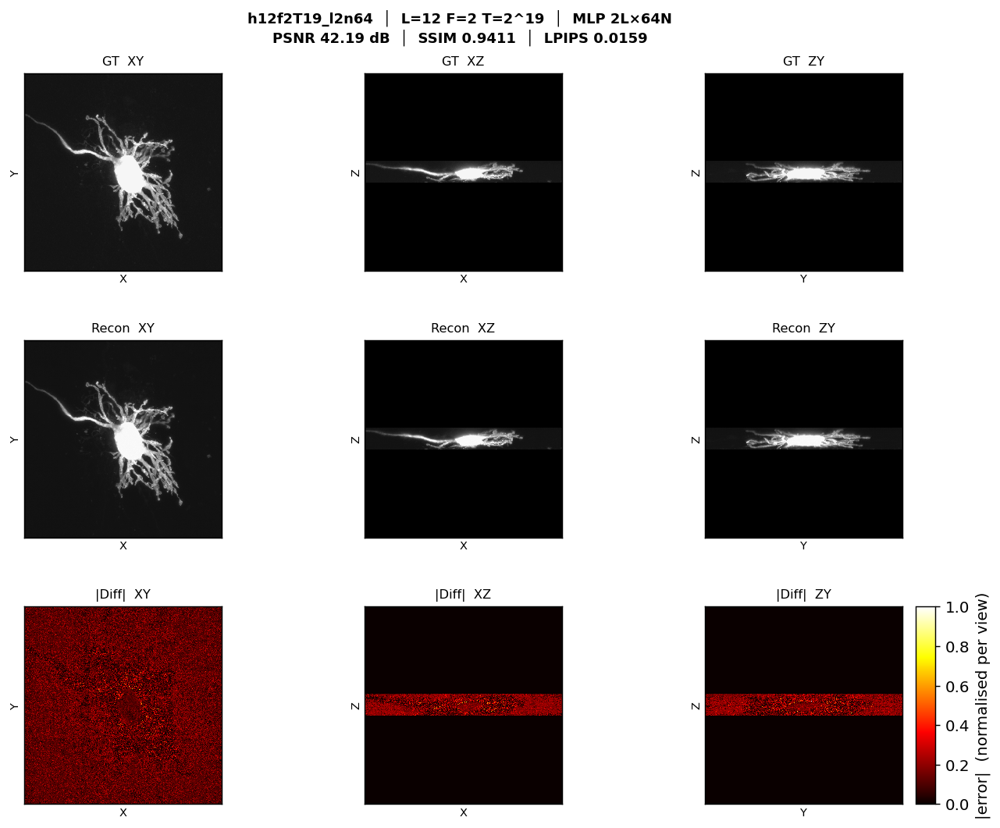

Saved → logs/ingp/ablation/mip_h12f2T19_l2n64.pdf


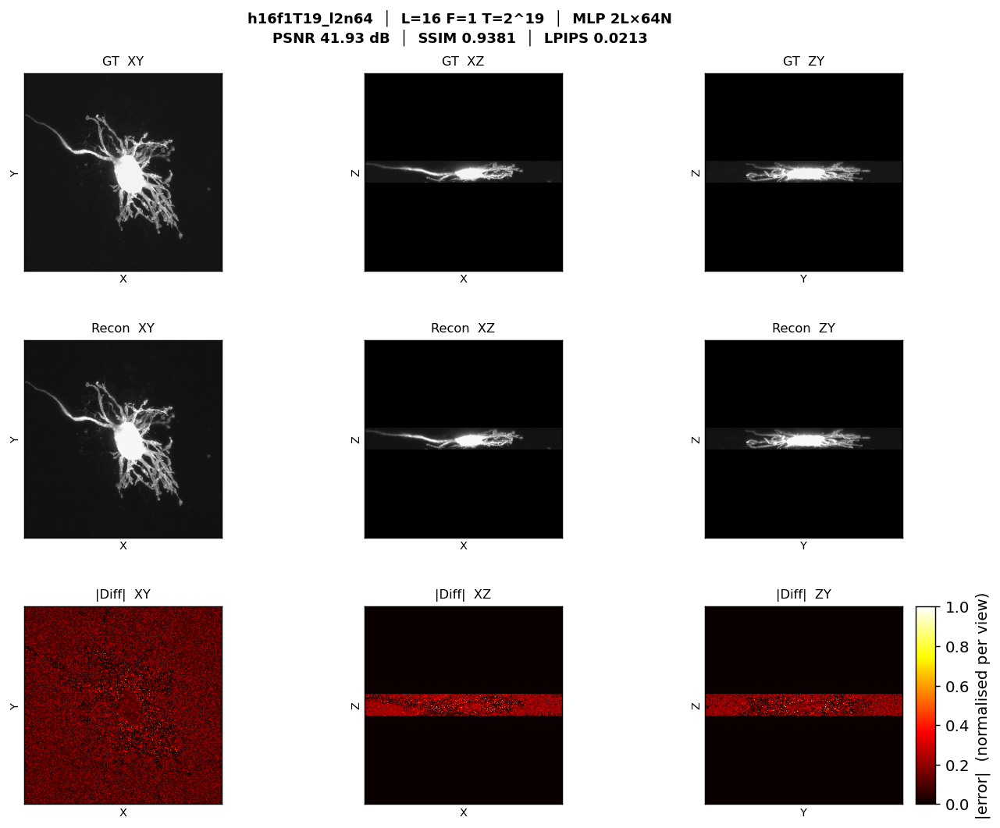

Saved → logs/ingp/ablation/mip_h16f1T19_l2n64.pdf


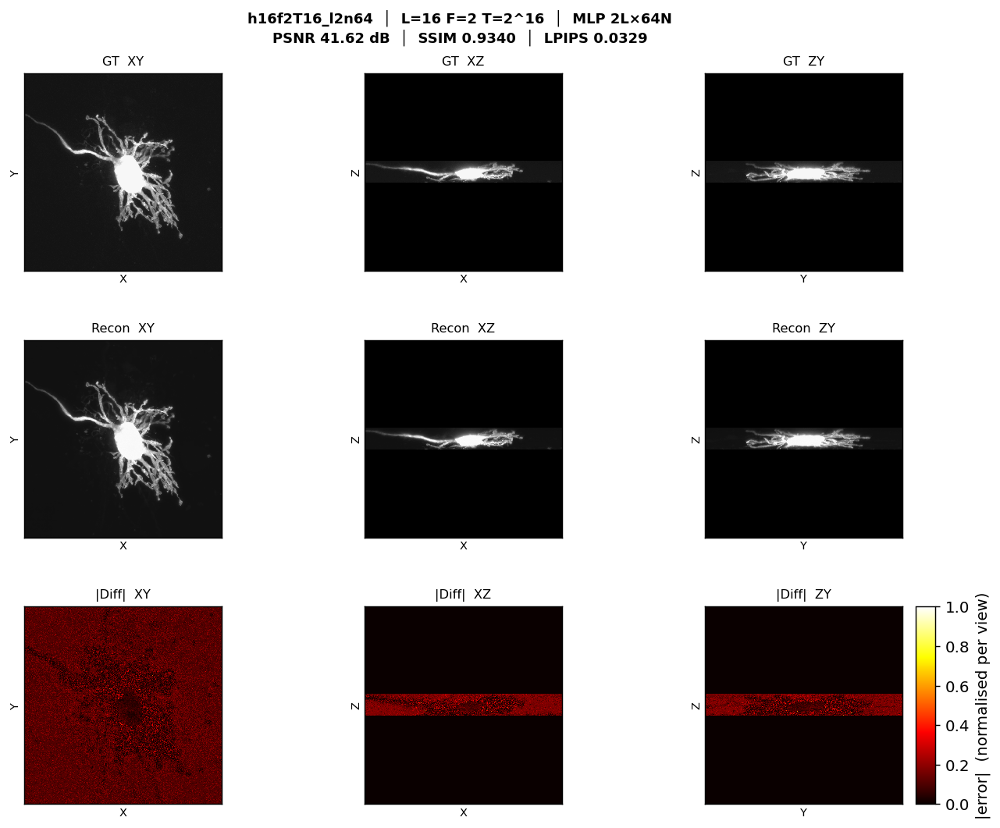

Saved → logs/ingp/ablation/mip_h16f2T16_l2n64.pdf


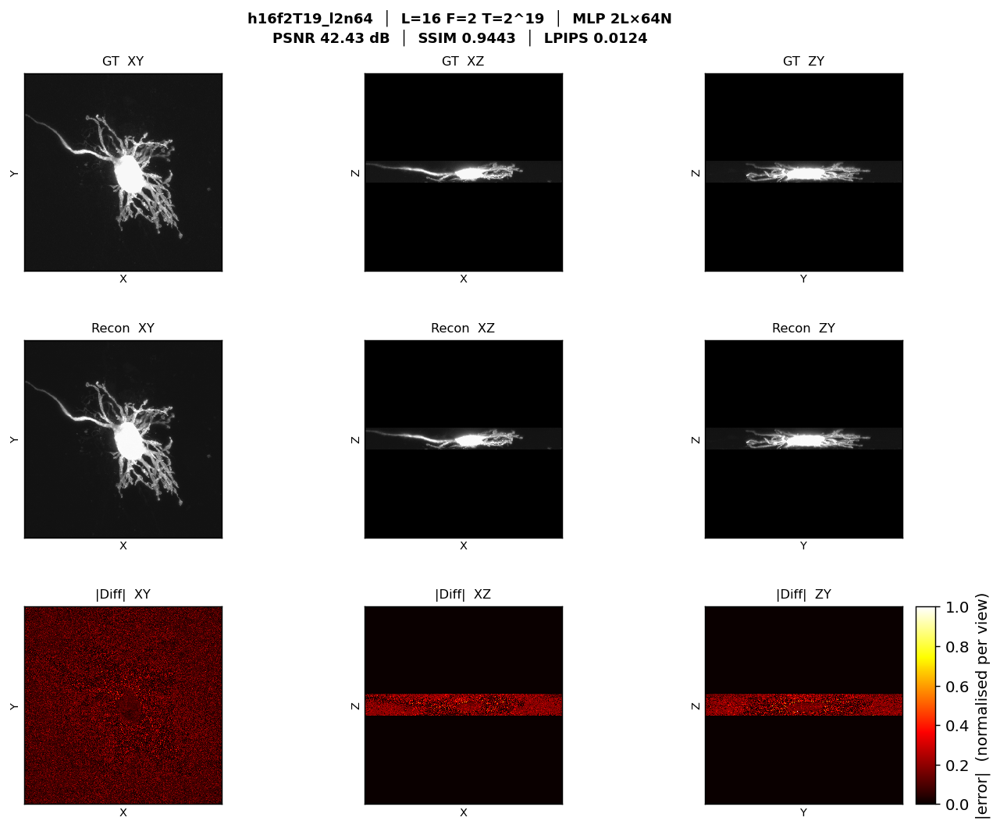

Saved → logs/ingp/ablation/mip_h16f2T19_l2n64.pdf


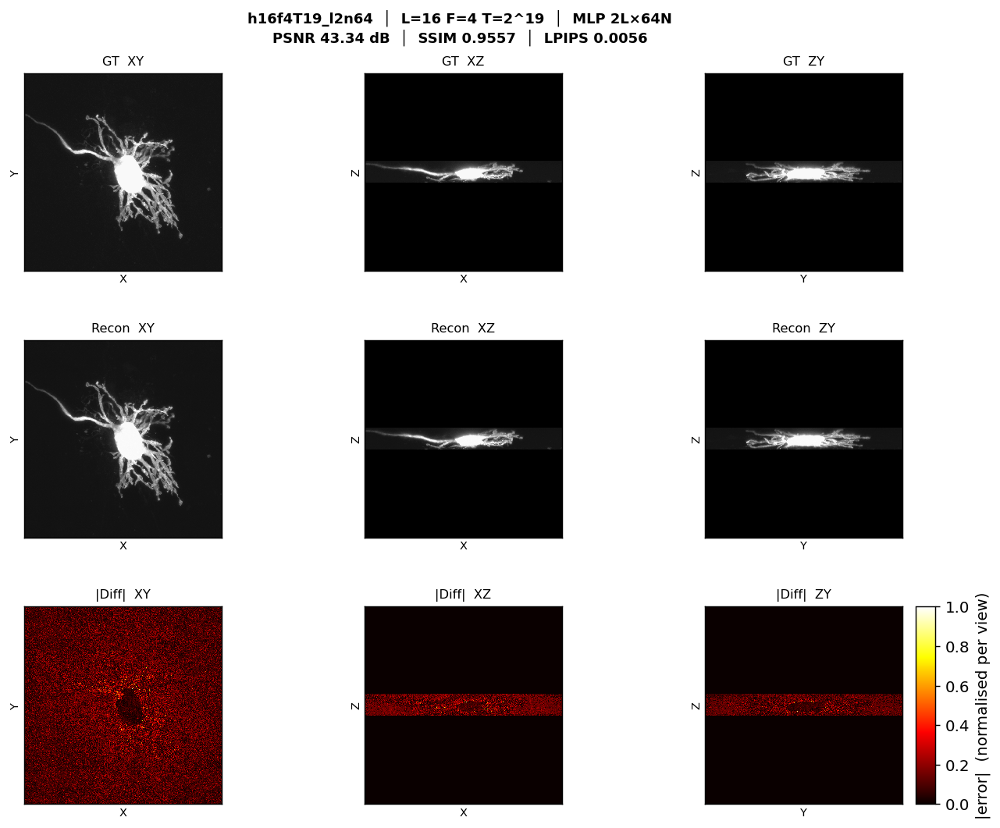

Saved → logs/ingp/ablation/mip_h16f4T19_l2n64.pdf


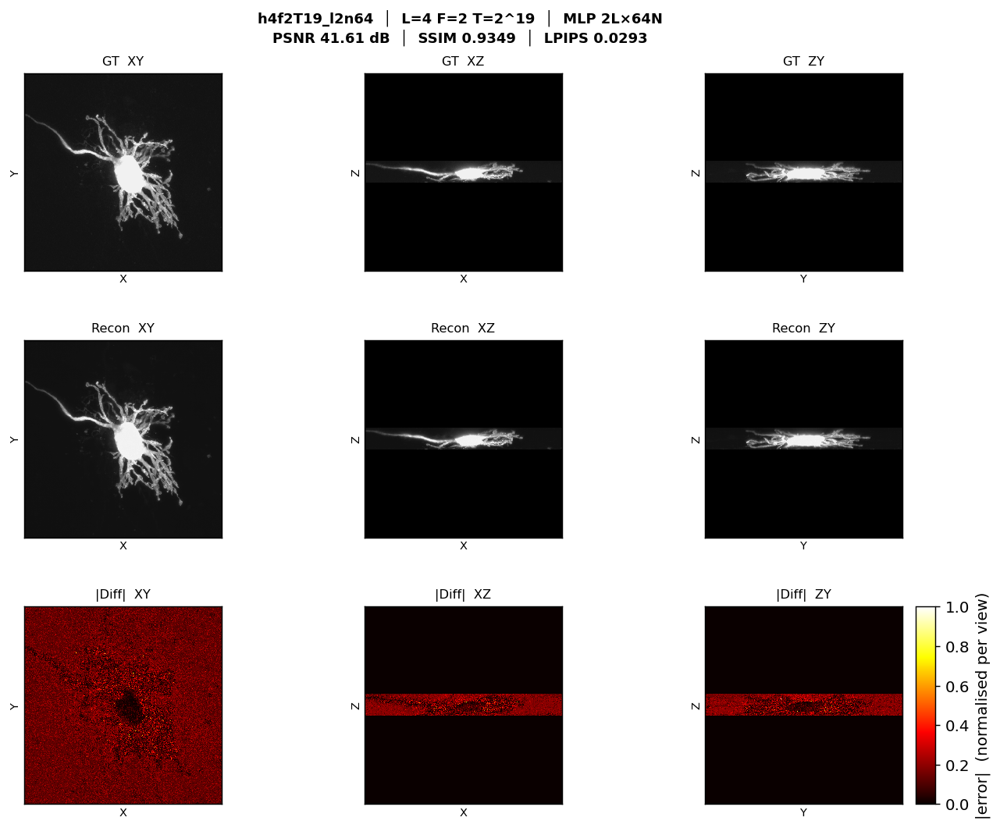

Saved → logs/ingp/ablation/mip_h4f2T19_l2n64.pdf


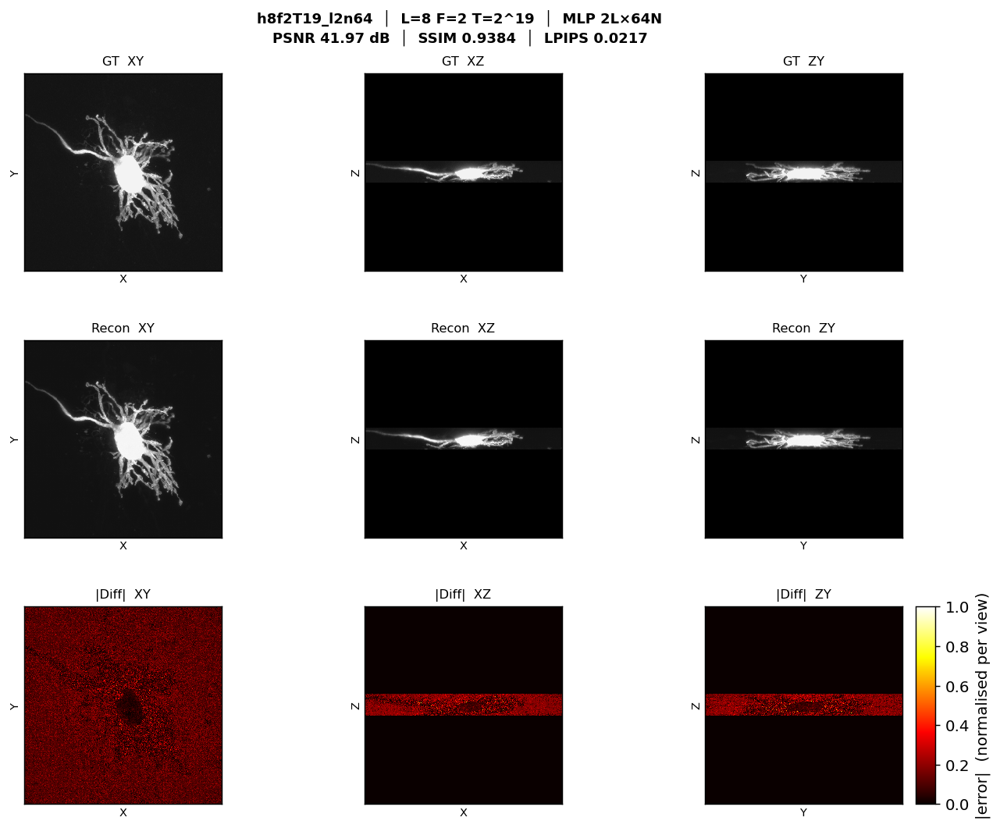

Saved → logs/ingp/ablation/mip_h8f2T19_l2n64.pdf


In [16]:
def pad_square(img, size=1024, fill=0.0):
    h, w = img.shape
    out  = np.full((size, size), fill, dtype=np.float32)
    y0   = (size - h) // 2; x0 = (size - w) // 2
    out[y0:y0+h, x0:x0+w] = img
    return out

for _, row in df.iterrows():
    model = load_ingp_model(row)
    if model is None:
        print(f"{row['run']}: no checkpoint, skipping")
        continue

    recon     = reconstruct(model)
    psnr_full = float(-10 * np.log10(((recon - gt_vol)**2).mean() + 1e-8))

    views = [
        ('XY', 'X', 'Y', np.max(gt_vol, axis=0), np.max(recon, axis=0)),
        ('XZ', 'X', 'Z', np.max(gt_vol, axis=1), np.max(recon, axis=1)),
        ('ZY', 'Y', 'Z', np.max(gt_vol, axis=2), np.max(recon, axis=2)),
    ]

    fig, axes = plt.subplots(3, 3, figsize=(13, 9))
    fig.subplots_adjust(top=0.91, right=0.88, hspace=0.35, wspace=0.08)
    ssim_s  = f"{float(row['ssim']):.4f}"  if row['ssim']  is not None else 'N/A'
    lpips_s = f"{float(row['lpips']):.4f}" if row['lpips'] is not None else 'N/A'
    fig.suptitle(
        f"{row['run']}  │  L={int(row['n_levels'])} F={int(row['n_feat'])} "
        f"T=2^{int(row['log2T'])}  │  MLP {int(row['layers'])}L×{int(row['neurons'])}N\n"
        f"PSNR {psnr_full:.2f} dB  │  SSIM {ssim_s}  │  LPIPS {lpips_s}",
        fontsize=10, fontweight='bold'
    )

    vmin = min(gt_vol.min(), recon.min())
    vmax = max(gt_vol.max(), recon.max())

    for col, (label, xlabel, ylabel, gt_mip, rc_mip) in enumerate(views):
        diff_mip = np.abs(gt_mip - rc_mip)
        diff_max = diff_mip.max() + 1e-8
        gt_sq    = pad_square(gt_mip)
        rc_sq    = pad_square(rc_mip)
        diff_sq  = pad_square(diff_mip / diff_max)

        for row_idx, (img, cmap, vlo, vhi, title) in enumerate([
            (gt_sq,   'gray', vmin, vmax, f'GT  {label}'),
            (rc_sq,   'gray', vmin, vmax, f'Recon  {label}'),
            (diff_sq, 'hot',  0,    1,    f'|Diff|  {label}'),
        ]):
            ax = axes[row_idx, col]
            im_obj = ax.imshow(img, cmap=cmap, vmin=vlo, vmax=vhi,
                               aspect='equal', interpolation='nearest')
            ax.set_title(title, fontsize=9)
            ax.set_xlabel(xlabel, fontsize=8, labelpad=2)
            ax.set_ylabel(ylabel, fontsize=8, labelpad=2)
            ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
            if row_idx == 2:
                im = im_obj

    fig.canvas.draw()
    p0 = axes[2, 0].get_position(); p1 = axes[2, -1].get_position()
    cbar_ax = fig.add_axes([p1.x1 + 0.01, p0.y0, 0.015, p0.y1 - p0.y0])
    fig.colorbar(im, cax=cbar_ax, label='|error|  (normalised per view)')

    out = LOGS / 'ablation' / f"mip_{row['run']}.pdf"
    plt.savefig(out, dpi=600, bbox_inches='tight')
    plt.show()
    print(f'Saved → {out}')
    torch.cuda.empty_cache()
